In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import math
from keras.models import Sequential
from keras.layers import Dense, Activation, LocallyConnected2D, Flatten, Conv2D, MaxPooling2D
from keras.layers import Dropout
from keras import backend as K
#K.set_image_dim_ordering('th')
from keras.initializers import *
from keras.optimizers import *
from keras import regularizers
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils
from sklearn.model_selection import train_test_split
import sklearn.preprocessing as pre
import os
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
os.environ["KMP_DUPLICATE_LIB_OK"]="True"
from mlxtend.evaluate import confusion_matrix 
from mlxtend.plotting import plot_confusion_matrix

Using TensorFlow backend.


In [2]:
###Load the data
data = pd.read_csv("H1B_case_Status.csv",low_memory=False) 

In [3]:
oldlist=data['CASE_NUMBER']

In [4]:
oldlist

0         I-200-16055-173457
1         I-200-16064-557834
2         I-200-16063-996093
3         I-200-16272-196340
4         I-200-15053-636744
5         I-200-15071-336195
6         I-200-16056-842817
7         I-200-16056-757335
8         I-200-16058-469533
9         I-200-16059-084066
10        I-200-16060-138258
11        I-200-16083-623465
12        I-200-16083-782891
13        I-200-16083-651459
14        I-200-16083-722720
15        I-200-16084-911950
16        I-200-16276-853235
17        I-200-13260-552852
18        I-200-13261-450672
19        I-200-13261-428354
20        I-200-13266-966905
21        I-200-13291-566704
22        I-200-13294-544059
23        I-200-13297-849893
24        I-200-13338-801657
25        I-200-13353-669114
26        I-200-13357-734910
27        I-200-14051-198952
28        I-200-14052-116073
29        I-200-14058-790431
                 ...        
624620    I-203-17269-466479
624621    I-200-17271-642943
624622    I-200-17272-196859
624623    I-20

In [5]:
newlist=[]
for x in oldlist:
    x=x.replace('-','')
    newlist.append(x[1:])

In [6]:
data['CASE_NUMBER'] = np.array(newlist)

In [7]:
def convert_status_numeric(columns):
    #for x in columns[0]:
    if columns[0]=='CERTIFIED-WITHDRAWN':
        return 0
    elif columns[0]=='DENIED':
        return 1
    elif columns[0]=='WITHDRAWN':
        return 2
    elif columns[0]=='CERTIFIED':
        return 3

In [8]:
data['CASE_STATUS'] = data[['CASE_STATUS']].apply(convert_status_numeric,axis=1)

In [9]:
data['CASE_SUBMITTED']=pd.to_datetime(data['CASE_SUBMITTED'])
data['CASE_SUBMITTED']=pd.DataFrame((data['CASE_SUBMITTED'] - dt.datetime(1970,1,1)).dt.total_seconds())

In [10]:
data['DECISION_DATE']=pd.to_datetime(data['DECISION_DATE'])
data['DECISION_DATE']=pd.DataFrame((data['DECISION_DATE'] - dt.datetime(1970,1,1)).dt.total_seconds())

In [11]:
data=data.drop(['Unnamed: 0','VISA_CLASS','EMPLOYER_BUSINESS_DBA','EMPLOYER_COUNTRY','EMPLOYER_PROVINCE',
                'EMPLOYER_PHONE_EXT','EMPLOYER_ADDRESS','EMPLOYER_CITY','EMPLOYER_STATE','EMPLOYER_POSTAL_CODE',
               'AGENT_ATTORNEY_NAME','AGENT_ATTORNEY_CITY','AGENT_ATTORNEY_STATE','EMPLOYER_PHONE',
               'SOC_CODE','NAICS_CODE','PUBLIC_DISCLOSURE_LOCATION','WORKSITE_CITY','WORKSITE_COUNTY',
               'WORKSITE_STATE','WORKSITE_POSTAL_CODE','PW_SOURCE_OTHER','WAGE_RATE_OF_PAY_FROM',
               'WAGE_UNIT_OF_PAY'],axis=1)

In [12]:
data['EMPLOYMENT_START_DATE'] = data['EMPLOYMENT_START_DATE'].fillna(data['EMPLOYMENT_START_DATE'].mode()[0])
data['EMPLOYMENT_START_DATE']=pd.to_datetime(data['EMPLOYMENT_START_DATE'])
data['EMPLOYMENT_START_DATE']=pd.DataFrame((data['EMPLOYMENT_START_DATE'] - dt.datetime(1970,1,1)).dt.total_seconds())

In [13]:
data['EMPLOYMENT_END_DATE'] = data['EMPLOYMENT_END_DATE'].fillna(data['EMPLOYMENT_END_DATE'].mode()[0])
data['EMPLOYMENT_END_DATE']=pd.to_datetime(data['EMPLOYMENT_END_DATE'])
data['EMPLOYMENT_END_DATE']=pd.DataFrame((data['EMPLOYMENT_END_DATE'] - dt.datetime(1970,1,1)).dt.total_seconds())

In [14]:
data['EMPLOYER_NAME'] = data['EMPLOYER_NAME'].fillna(data['EMPLOYER_NAME'].mode()[0])

In [15]:
name_dict=data['EMPLOYER_NAME'].value_counts().to_dict()

In [16]:
new_dict={}
count=1
for key,value in name_dict.items():
    if value > 500:
        new_dict[key] = count
        count+=1
    else:
        new_dict[key] = 0

In [17]:
data['EMPLOYER_NAME'] = data['EMPLOYER_NAME'].apply(lambda x: new_dict.get(x))

In [18]:
data['EMPLOYER_NAME'].value_counts()

0     456980
1      20643
2      13529
3       9604
4       8734
5       7543
6       7179
7       6690
8       6096
9       5177
10      5074
11      5005
12      4263
13      4187
14      4165
15      2707
16      2546
17      1921
18      1842
19      1822
20      1766
21      1736
22      1710
23      1688
24      1543
25      1538
26      1403
27      1300
28      1258
29      1219
       ...  
42       883
43       868
44       857
45       851
46       850
47       835
48       820
49       816
50       795
51       791
52       739
53       735
54       732
55       726
56       719
57       719
58       692
59       650
60       635
61       631
62       630
63       625
64       611
65       611
66       604
67       593
68       549
69       531
70       520
71       512
Name: EMPLOYER_NAME, Length: 72, dtype: int64

In [19]:
def process_agent(columns):
    if columns[0]=='Y':
        return 1
    else:
        return 0

In [20]:
data['AGENT_REPRESENTING_EMPLOYER'] = data[['AGENT_REPRESENTING_EMPLOYER']].apply(process_agent,axis=1)

In [21]:
data['JOB_TITLE']=data['JOB_TITLE'].fillna(data['JOB_TITLE'].mode()[0])
title_dict=data['JOB_TITLE'].value_counts().to_dict()
new_dict={}
count=1
for key,value in title_dict.items():
    if value > 500:
        new_dict[key] = count
        count+=1
    else:
        new_dict[key] = 0

In [22]:
data['JOB_TITLE'] = data['JOB_TITLE'].apply(lambda x: new_dict.get(x))

In [23]:
data['JOB_TITLE'].value_counts()

0      325019
1       47156
2       27950
3       16107
4       10798
5        7410
6        7303
7        6983
8        6555
9        5835
10       4957
11       4262
12       3816
13       3717
14       3354
15       3155
16       3111
17       3080
18       2812
19       2715
20       2600
21       2534
22       2480
23       2425
24       2238
25       2160
26       2012
27       1943
28       1935
29       1916
        ...  
121       599
122       598
123       593
124       593
125       586
127       584
126       584
128       581
129       580
130       578
131       577
132       577
133       566
134       565
135       565
136       559
137       553
138       549
139       547
140       546
141       539
142       528
143       526
144       525
145       524
146       522
147       516
148       514
149       511
150       504
Name: JOB_TITLE, Length: 151, dtype: int64

In [248]:

data['SOC_NAME'] = data['SOC_NAME'].fillna(data['SOC_NAME'].mode()[0])
data['SOC_NAME1'] = 'OTHERS'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('COMPUTER','SOFTWARE')] = 'IT'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('OPERATIONS','WEB')] = 'IT'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('ANALYSTS','SYSTEMS')] = 'IT'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('CHIEF','MANAGEMENT')] = 'MANAGER'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('MECHANICAL')] = 'MECHANICAL'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('DATABASE')] = 'DATABASE'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('DATABASE','MARKET')] = 'SALES'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('DISTRIBUTION','LOGISTICS')] = 'SALES'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('FINANCIAL')] = 'FINANCE'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('PUBLIC','FUNDRAISING')] = 'PR'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('EDUCATION','LAW')] = 'ADMINISTRATIVE'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('AUDITORS','COMPLIANCE')] = 'AUDIT'


data['SOC_NAME1'][data['SOC_NAME'].str.contains('RECRUITERS','HUMAN')] = 'HR'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('AGRICULTURAL','FARM')] = 'AGRI'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('CONSTRUCTION','ARCHITECTURAL')] = 'ESTATE'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('FORENSIC','HEALTH')] = 'MEDICAL'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('CLINICAL')] = 'MEDICAL'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('TEACHERS')] = 'EDUCATION'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('BIOLOGICAL','SCIENTISTS')] = 'SCIENCE'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('SOIL','MATHEMATICIANS')] = 'SCIENCE'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('PHARMACISTS')] = 'SCIENCE'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('ELECTRICAL','ELECTRONICS')] = 'ENGINEER'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('CIVIL','AEROSPACE')] = 'ENGINEER'
data=data.drop(['SOC_NAME'],axis=1)

/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingW

In [249]:
def processTitle(columns):
    if columns[0]=='IT':
        return 1
    elif columns[0]=='MANAGER':
        return 2
    elif columns[0]=='MECHANICAL':
        return 3
    elif columns[0]=='DATABASE':
        return 4
    elif columns[0]=='SALES':
        return 5
    elif columns[0]=='FINANCE':
        return 6
    elif columns[0]=='PR':
        return 7
    elif columns[0]=='ADMINISTRATIVE':
        return 8
    elif columns[0]=='AUDIT':
        return 9
    elif columns[0]=='HR':
        return 10
    elif columns[0]=='AGRI':
        return 11
    elif columns[0]=='ESTATE':
        return 12
    elif columns[0]=='MEDICAL':
        return 13
    elif columns[0]=='EDUCATION':
        return 14
    elif columns[0]=='SCIENCE':
        return 15
    elif columns[0]=='ENGINEER':
        return 16
    else:
        return 0

In [250]:
data['SOC_NAME1'] = data[['SOC_NAME1']].apply(processTitle,axis=1)

In [251]:
def process_position(columns):
    if columns[0]=='N':
        return 0
    else:
        return 1

In [252]:
data['FULL_TIME_POSITION']=data['FULL_TIME_POSITION'].fillna(data['FULL_TIME_POSITION'].mode()[0])
data['FULL_TIME_POSITION'] = data[['FULL_TIME_POSITION']].apply(process_position,axis=1)

data['WILLFUL_VIOLATOR']=data['WILLFUL_VIOLATOR'].fillna(data['WILLFUL_VIOLATOR'].mode()[0])
data['WILLFUL_VIOLATOR']=data[['WILLFUL_VIOLATOR']].apply(process_position,axis=1)

data['H1B_DEPENDENT']=data['H1B_DEPENDENT'].fillna(data['H1B_DEPENDENT'].mode()[0])
data['H1B_DEPENDENT']=data[['H1B_DEPENDENT']].apply(process_position,axis=1)

data['SUPPORT_H1B']=data['SUPPORT_H1B'].fillna(data['SUPPORT_H1B'].mode()[0])
data['SUPPORT_H1B']=data[['SUPPORT_H1B']].apply(process_position,axis=1)

data['LABOR_CON_AGREE']=data['LABOR_CON_AGREE'].fillna(data['LABOR_CON_AGREE'].mode()[0])
data['LABOR_CON_AGREE']=data[['LABOR_CON_AGREE']].apply(process_position,axis=1)


In [253]:
data['ORIGINAL_CERT_DATE'] = data['ORIGINAL_CERT_DATE'].fillna(data['ORIGINAL_CERT_DATE'].mode()[0])
data['ORIGINAL_CERT_DATE']=pd.to_datetime(data['ORIGINAL_CERT_DATE'])
data['ORIGINAL_CERT_DATE']=pd.DataFrame((data['ORIGINAL_CERT_DATE'] - dt.datetime(1970,1,1)).dt.total_seconds())

In [254]:
#data['PREVAILING_WAGE'].isna().sum()
data['PW_UNIT_OF_PAY']=data['PW_UNIT_OF_PAY'].fillna(data['PW_UNIT_OF_PAY'].mode()[0])
data['PREVAILING_WAGE']=data['PREVAILING_WAGE'].fillna(data['PREVAILING_WAGE'].mode()[0])

In [255]:
def process_wages(columns):
    if columns[1]=='Hour':
        value=(int(columns[0])*8*5*52)
        return int(value)
    elif columns[1]=='Week':
        value=(int(columns[0])*52)
        return int(value)
    elif columns[1]=='Biweekly':
        value=(int(columns[0])*26)
        return int(value)
    elif columns[1]=='Month':
        value= (int(columns[0])*12)
        return int(value)
    else:
        return int(columns[0])

In [256]:
#column_name=data['PW_UNIT_OF_PAY']
data['PREVAILING_WAGE']=data[['PREVAILING_WAGE','PW_UNIT_OF_PAY']].apply(process_wages,axis=1)

In [257]:
data=data.drop(['PW_UNIT_OF_PAY'],axis=1)

In [258]:
data['PW_WAGE_LEVEL']=data['PW_WAGE_LEVEL'].fillna(data['PW_WAGE_LEVEL'].mode()[0])

In [259]:
data['PW_WAGE_LEVEL'].value_counts()

Level I      345568
Level II     179435
Level III     62921
Level IV      36726
Name: PW_WAGE_LEVEL, dtype: int64

In [260]:
def processWageLevel(columns):
    if columns[0]=='Level I':
        return 1
    elif columns[0]=='Level II':
        return 2
    elif columns[0]=='Level III':
        return 3
    elif columns[0]=='Level IV':
        return 4

In [261]:
data['PW_WAGE_LEVEL']=data[['PW_WAGE_LEVEL']].apply(processWageLevel,axis=1)

In [262]:
def processSource(columns):
    if columns[0]=='OES':
        return 1
    elif columns[0]=='CBA':
        return 2
    elif columns[0]=='DBA':
        return 3
    elif columns[0]=='SCA':
        return 4
    else:
        return 0

In [263]:
data['PW_SOURCE']=data['PW_SOURCE'].fillna(data['PW_SOURCE'].mode()[0])
data['PW_SOURCE']=data[['PW_SOURCE']].apply(processSource,axis=1)

In [264]:
data['PW_SOURCE_YEAR']=data['PW_SOURCE_YEAR'].fillna(data['PW_SOURCE_YEAR'].mode()[0])

In [265]:
data['WAGE_RATE_OF_PAY_TO']=data['WAGE_RATE_OF_PAY_TO'].fillna(data['WAGE_RATE_OF_PAY_TO'].mode()[0])
#data['WAGE_UNIT_OF_PAY']=data['WAGE_UNIT_OF_PAY'].fillna(data['WAGE_UNIT_OF_PAY'].mode()[0])

In [266]:
data['CASE_STATUS'].value_counts()

3    545694
0     49704
2     20772
1      8480
Name: CASE_STATUS, dtype: int64

In [267]:
dataNew = data[data.CASE_STATUS != 0]

In [268]:
dataNew['CASE_STATUS'].value_counts()

3    545694
2     20772
1      8480
Name: CASE_STATUS, dtype: int64

In [269]:
dataNew = dataNew[dataNew.CASE_STATUS != 2]

In [270]:
dataNew['CASE_STATUS'].value_counts()

3    545694
1      8480
Name: CASE_STATUS, dtype: int64

In [271]:
dataNew=dataNew.reset_index(drop=True)

In [272]:
dataNew.head()

,CASE_NUMBER,CASE_STATUS,CASE_SUBMITTED,DECISION_DATE,EMPLOYMENT_START_DATE,EMPLOYMENT_END_DATE,EMPLOYER_NAME,AGENT_REPRESENTING_EMPLOYER,JOB_TITLE,TOTAL_WORKERS,...,PW_WAGE_LEVEL,PW_SOURCE,PW_SOURCE_YEAR,WAGE_RATE_OF_PAY_TO,H1B_DEPENDENT,WILLFUL_VIOLATOR,SUPPORT_H1B,LABOR_CON_AGREE,ORIGINAL_CERT_DATE,SOC_NAME1
0,20009209039181,3,1.474934e+09,1.475453e+09,1.475280e+09,1.568938e+09,0,1,0,1,...,1,1,2016.0,124675.0,1,0,1,1,1.489622e+09,0
1,20016266171133,3,1.474934e+09,1.475453e+09,1.474934e+09,1.569024e+09,2,1,13,1,...,3,1,2016.0,94500.0,1,0,1,1,1.489622e+09,0
2,20016266208642,3,1.474934e+09,1.475453e+09,1.490573e+09,1.585181e+09,0,1,109,1,...,2,1,2016.0,0.0,0,0,1,1,1.489622e+09,0
3,20016263193057,3,1.474934e+09,1.475453e+09,1.489536e+09,1.583971e+09,0,1,75,1,...,3,1,2016.0,125000.0,0,0,1,1,1.489622e+09,0
4,20016263433294,3,1.474934e+09,1.475453e+09,1.478477e+09,1.504138e+09,0,0,0,1,...,2,1,2016.0,0.0,0,0,1,1,1.489622e+09,15


data=data.loc[(data.CASE_STATUS !=0) | (data.CASE_STATUS != 3)]

In [273]:
dataNew.isna().sum()

CASE_NUMBER                    0
CASE_STATUS                    0
CASE_SUBMITTED                 0
DECISION_DATE                  0
EMPLOYMENT_START_DATE          0
EMPLOYMENT_END_DATE            0
EMPLOYER_NAME                  0
AGENT_REPRESENTING_EMPLOYER    0
JOB_TITLE                      0
TOTAL_WORKERS                  0
NEW_EMPLOYMENT                 0
CONTINUED_EMPLOYMENT           0
CHANGE_PREVIOUS_EMPLOYMENT     0
NEW_CONCURRENT_EMPLOYMENT      0
CHANGE_EMPLOYER                0
AMENDED_PETITION               0
FULL_TIME_POSITION             0
PREVAILING_WAGE                0
PW_WAGE_LEVEL                  0
PW_SOURCE                      0
PW_SOURCE_YEAR                 0
WAGE_RATE_OF_PAY_TO            0
H1B_DEPENDENT                  0
WILLFUL_VIOLATOR               0
SUPPORT_H1B                    0
LABOR_CON_AGREE                0
ORIGINAL_CERT_DATE             0
SOC_NAME1                      0
dtype: int64

In [274]:
dataOutput=pd.DataFrame(dataNew['CASE_STATUS'])
dataNew=dataNew.drop(['CASE_STATUS'],axis=1)

In [275]:
dataOutput

,CASE_STATUS
0,3
1,3
2,3
3,3
4,3
5,3
6,3
7,3
8,3
9,3


In [276]:
trainingData_X, testingData_X, trainingData_Y, testingData_Y = train_test_split(dataNew,
                                                                                dataOutput,
                                                                                test_size = 0.33,
                                                                                random_state=5)

In [277]:
testingData_Y

,CASE_STATUS
468051,3
283431,3
360221,3
275789,3
38547,1
527544,3
363813,3
424991,3
334142,3
166823,3


In [278]:
scaler = pre.MinMaxScaler(feature_range=(0,1))
x_train=trainingData_X.values

intermediate=scaler.fit(x_train)
x_train=scaler.transform(x_train)

/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


In [279]:
x_test=testingData_X.values

intermediate=scaler.fit(x_test)
x_test=scaler.transform(x_test)

/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


In [280]:
y_train=trainingData_Y.values
y_test=testingData_Y.values

In [281]:
x_train=x_train.astype('float32')
y_train=y_train.astype('float32')
x_test=x_test.astype('float32')
y_test=y_test.astype('float32')

In [282]:
y_train = np_utils.to_categorical(y_train)
y_test = np_utils.to_categorical(y_test)

In [283]:
y_train

array([[0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       ...,
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.]], dtype=float32)

In [284]:
x_train.shape[1]

27

In [285]:
model=Sequential()
model.add(Dense(256, input_dim=x_train.shape[1],
                activation='relu',
                kernel_initializer=glorot_normal(seed=None),
               bias_initializer=Constant(value=0)))
model.add(Dropout(0.2))
model.add(Dense(128,activation='relu',
                kernel_initializer=he_normal(seed=None),
                bias_initializer=Constant(value=0)))
model.add(Dense(64,activation='relu'))

model.add(Dense(32,activation='relu'))
model.add(Dense(16,activation='relu'))
model.add(Dense(4, activation='softmax'))

In [286]:
model.compile(loss='categorical_crossentropy', optimizer='Adam',metrics=['accuracy'])

In [287]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_13 (Dense)             (None, 256)               7168      
_________________________________________________________________
dropout_3 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_14 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_15 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_16 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_17 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_18 (Dense)             (None, 4)                 68        
Total para

In [288]:
history=model.fit(x_train, y_train, validation_split=0.1, epochs=10)

Train on 334166 samples, validate on 37130 samples
Epoch 1/10
334166/334166 [==============================] - 318s 952us/step - loss: 0.0770 - acc: 0.9846 - val_loss: 0.0851 - val_acc: 0.9835
Epoch 2/10
334166/334166 [==============================] - 71s 213us/step - loss: 0.0738 - acc: 0.9848 - val_loss: 0.0800 - val_acc: 0.9835
Epoch 3/10
334166/334166 [==============================] - 69s 207us/step - loss: 0.0732 - acc: 0.9848 - val_loss: 0.0778 - val_acc: 0.9837
Epoch 4/10
334166/334166 [==============================] - 70s 211us/step - loss: 0.0727 - acc: 0.9849 - val_loss: 0.0771 - val_acc: 0.9837
Epoch 5/10
334166/334166 [==============================] - 70s 210us/step - loss: 0.0724 - acc: 0.9849 - val_loss: 0.0763 - val_acc: 0.9837
Epoch 6/10
334166/334166 [==============================] - 71s 212us/step - loss: 0.0724 - acc: 0.9849 - val_loss: 0.0776 - val_acc: 0.9837
Epoch 7/10
334166/334166 [==============================] - 71s 212us/step - loss: 0.0723 - acc: 0.984

In [57]:
scores = model.evaluate(x_test, y_test)

206135/206135 [==============================] - 8s 39us/step


In [58]:
print("Accuracy of the Model is: %.2f%% " % (scores[1]*100))

Accuracy of the Model is: 95.00% 


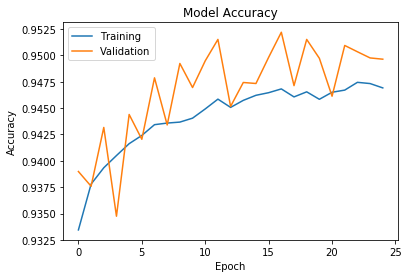

In [59]:
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='upper left')
plt.show()

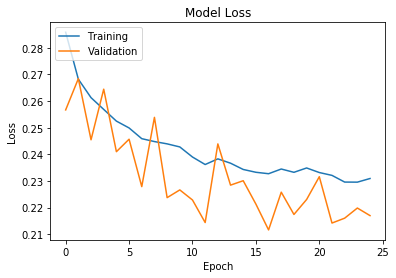

In [60]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='upper left')
plt.show()

In [61]:
print("Training complete...")
np.set_printoptions(precision=2,suppress=True)
for i in range(len(x_test)):
    print("Prediction: " + str(model.predict([x_test[i].reshape(1,x_test[i].shape[0])])) + " | True: " + str(y_test[i]))

Training complete...
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 

Prediction: [[0.01 0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.86 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.05 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.83 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.63 0.01 0.35 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.36 0.02 0.6  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.01 0.05 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.76 0.19]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.24 0.76 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | 

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 

Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.84 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.85 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | 

Prediction: [[0.04 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.   0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.07 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.83 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.77 0.19]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.91 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.02 0.79 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.82 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.84 0.11]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.85 0.07]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.02 0.75 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.84 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.8  0.15]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.0

Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.03 0.75 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.29 0.02 0.69 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | 

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.11 0.02 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.14 0.03 0.8  0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.06 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | 

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.01 0.04 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.96 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0

Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.84 0.1 ]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0. 

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.82 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.89 0.05]] | True: [0

Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.03 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.57 0.02 0.41 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.85 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.01 0.71 0.28]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.69 0.27]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.84 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.92 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.77 0.18]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | 

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | 

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.09 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0

Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.63 0.33]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | 

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1.

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | 

Prediction: [[0.01 0.04 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.85 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0.

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.83 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.74 0.21]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.94 0.01]] | 

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.02 0.82 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.93 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.67 0.29]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.81 0.15]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1.

Prediction: [[0.05 0.03 0.87 0.06]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.66 0.02 0.3  0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.86 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.37 0.02 0.59 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.78 0.17]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.02 0.8  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.92 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.0

Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.87 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | 

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.91 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.85 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.9  0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | 

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.87 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.02 0.7  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.64 0.33]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.82 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | 

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.08 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | 

Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.86 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.45 0.02 0.53 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.79 0.16]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.79 0.16]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.7  0.27]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.12 0.03 0.84 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.96 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.87 0.07]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.91 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.74 0.22]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.03 0.76 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.13 0.02 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0

Prediction: [[0.   0.05 0.85 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | 

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.82 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.   0.06 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.86 0.11]] | True: [0

Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.89 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.77 0.19]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.01 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.01 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.74 0.21]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.69 0.27]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0

Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.32 0.02 0.62 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.74 0.26 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.01 0.87 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.71 0.02 0.26 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.31 0.02 0.66 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.92 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.06 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.89 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.79 0.18]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0

Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.39 0.03 0.57 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.72 0.01 0.26 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | 

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.72 0.23]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | 

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.12 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.79 0.01 0.19 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | 

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0. 1. 0.

Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.02 0.78 0.2 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.85 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.67 0.29]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.85 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.74 0.22]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.67 0.01 0.31 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.87 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.85 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | 

Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.34 0.02 0.64 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.28 0.02 0.69 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.02 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.74 0.21]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.84 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.74 0.22]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.92 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.87 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.9  0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0

Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.   0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.83 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.77 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.68 0.28]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.86 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0

Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.8  0.15]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0

Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.82 0.13]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.06]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.9  0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.64 0.33]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.1  0.86 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.01 0.95 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.35 0.02 0.62 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0

Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.89 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.89 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.08 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1

Prediction: [[0.   0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.07 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.65 0.32]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.75 0.21]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.66 0

Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.87 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.89 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.8  0.15]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.   0.1  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.36 0.02 0.6  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.83 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.75 0.22]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.13 0.02 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.79 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.9  0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.85 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.9 0.1 0.  0. ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.15 0.02 0.81 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.19 0.02 0.74 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0

Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.02 0.69 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.22 0.03 0.73 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.02 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.84 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0

Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.06 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0

Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | 

Prediction: [[0.02 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.78 0.17]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.01 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | 

Prediction: [[0.03 0.03 0.86 0.08]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.82 0.   0.17 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.07 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.84 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.87 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.01 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.02 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | 

Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.88 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.83 0

Prediction: [[0.08 0.02 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.87 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.26 0.02 0.7  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.84 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.87 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | 

Prediction: [[0.01 0.04 0.83 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.06 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.06 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.01 0.86 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.83 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.85 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.9  0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.74 0.21]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | 

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.69 0.27]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.86 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0

Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.   0.04 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.75 0.2 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | 

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.53 0.01 0.44 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.96 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.88 0.09]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.73 0.01 0.24 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.03]] | 

Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.06 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.01 0.77 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.08]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | 

Prediction: [[0.01 0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.12 0.88 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.41 0.02 0.56 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.03 0.82 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.82 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.12 0.03 0.83 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.86 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.66 0.33]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.88 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.84 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.32 0.02 0.62 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.88 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.08 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.79 0.02 0.19 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: 

Prediction: [[0.04 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | 

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.85 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.86 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.07 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.83 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.01 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.69 0.27]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.75 0.2 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.81 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.34 0.66 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.   0.05 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.25 0.02 0.69 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0.

Prediction: [[0.03 0.02 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.26 0.02 0.7  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.86 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | 

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.22 0.02 0.74 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.94 0.06 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.85 0.01 0.15 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.86 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.05]] | 

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.09 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.85 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.73 0.24]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.85 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0

Prediction: [[0.02 0.06 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | 

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.37 0.02 0.6  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.91 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.81 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.05]] | 

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.73 0.22]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.92 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.85 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.87 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0. 

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.83 0.12]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.75 0.22]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.03 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.9  0.   0.09 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | 

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.75 0.19]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.02 0.71 0.26]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.84 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.9  0.01 0.1  0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.76 0.19]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | 

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.76 0.19]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.62 0.01 0.36 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.86 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | 

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.84 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | 

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.94 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.02 0.77 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.98 0.02 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.82 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0

Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.36 0.01 0.63 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.78 0.18]] | True: [0. 0. 0. 1.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0

Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.12 0.88 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.87 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.   0.1  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.86 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | 

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0

Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.34 0.01 0.64 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.87 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | 

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | 

Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0

Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.83 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | 

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.07 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.82 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.8  0.16]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | 

Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | 

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.34 0.01 0.65 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.82 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | 

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | 

Prediction: [[0.   0.04 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.87 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.35 0.02 0.62 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.06 0.86 0.07]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.   0.04 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.76 0.2 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.46 0.02 0.51 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.86 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.79 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.33 0.03 0.64 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.49 0.02 0.47 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.85 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.25 0.02 0.71 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.97 0

Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.62 0.01 0.37 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.09 0.03 0.83 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.74 0.24]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | 

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.02]] | 

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.88 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.01 0.77 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | 

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | 

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | 

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.82 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0

Prediction: [[0.04 0.03 0.85 0.08]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.75 0.2 ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.02 0.76 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | 

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | 

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.7  0.26]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.82 0.01 0.16 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0. 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | 

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.14 0.03 0.81 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.03 0.77 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.11 0.02 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.84 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.37 0.02 0.6  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.86 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.84 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.55 0.45 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.85 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0

Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | 

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.85 0.06]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.07 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.03 0.04 0.84 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.23 0.02 0.71 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.97 0.   0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.38 0.02 0.59 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [1

Prediction: [[0.02 0.04 0.89 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.05 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.02 0.76 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.8  0.02 0.16 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.83 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.02 0.77 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | 

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.9  0.   0.09 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1

Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.85 0.07]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | 

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.81 0.15]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.29 0.02 0.67 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0. 

Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.03 0.75 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.56 0.01 0.41 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.06 0.81 0.13]] | True: [0. 0. 0. 1.]
Prediction: [[0.9  0.01 0.08 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.83 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.97 0.01 0.01 0.  ]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.08 0.0

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.81 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.73 0.23]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.69 0.02 0.29 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.84 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 

Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.9  0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.66 0.34 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0

Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.02 0.79 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.0

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | 

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.91 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.61 0.37]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0

Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.75 0.21]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | 

Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.01 0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.76 0.01 0.23 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | 

Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.07 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.87 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.76 0.2 ]] | True: [0. 0. 0. 1.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0.

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.01 0.04 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.75 0.21]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.81 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.  0.  0.9 0.1]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.

Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.77 0.19]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.73 0.23]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.83 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.04 0.85 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.84 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.73 0.01 0.26 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.82 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.9  0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.87 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.02 0.81 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.09 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.87 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.71 0.2

Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | 

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.71 0.01 0.27 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.02 0.82 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.02 0.74 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0

Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.83 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.63 0.34]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.8  0.15]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.71 0.25]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.69 0.29]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.73 0.23]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.85 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.57 0.01 0.41 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.86 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | 

Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.79 0.   0.21 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.86 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.89 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.11 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.75 0.22]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.01 0.79 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.11 0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.02 0.79 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.07 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.01 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.69 0.27]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.9  0

Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.75 0.2 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.84 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.89 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.89 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.73 0.23]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.85 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.01 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.78 0.18]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.83 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.13 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.82 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.91 0

Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.72 0.02 0.25 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.06 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | 

Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.74 0.22]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.06 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.54 0.02 0.41 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.02 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.84 0.01 0.15 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.22 0.02 0.74 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.08 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.84 0.12]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0

Prediction: [[0.   0.05 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.81 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.82 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.49 0.02 0.48 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.01 0.89 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.82 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.86 0.08]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.74 0.01 0.24 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.79 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.88 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.91 0.   0.09 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.02 0.78 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.81 0.14]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | 

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.82 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | 

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.96 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.07 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [1

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.14 0.02 0.79 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | 

Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.82 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.89 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.   0.04 0.85 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.23 0.02 0.69 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.11 0.02 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.69 0.27]] | 

Prediction: [[0.01 0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.86 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.83 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.79 0.15]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.95 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.83 0.11]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.87 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.91 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.12 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | 

Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.73 0.24]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.84 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.05 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.29 0.03 0.65 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.06 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.31 0.02 0.66 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.03 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.02 0.78 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.   0.07 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.69 0.27]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | 

Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.07 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.01 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.87 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | 

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.14 0.02 0.82 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.86 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.68 0.28]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.02 0.7  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.   0.06 0.8  0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.01 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.06 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.85 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | 

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.84 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.81 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.82 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.97 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.88 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.02 0.7  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0

Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.79 0.01 0.2  0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0

Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0

Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.68 0.29]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.0

Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.66 0.33]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | 

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0. 

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.26 0.03 0.71 0.01]] | True: [0

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.69 0.01 0.27 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.   0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.85 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.91 0.03 0.06 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.74 0.23]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.07 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.87 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.05 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.56 0.02 0.4  0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.06]] | True: [0. 0. 1. 

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.07 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.91 0.01 0.07 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.63 0.35]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | 

Prediction: [[0.53 0.01 0.46 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.03 0.79 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.07 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.   0.07 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.07 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.85 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.67 0.01 0.31 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.91 0.01 0.08 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | 

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0

Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.64 0.32]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.93 0.01 0.06 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.69 0.27]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.02 0.74 0.24]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.7  0.26]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.85 0.09]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | 

Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | 

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.96 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | 

Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0

Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.85 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | 

Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.63 0.01 0.35 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.02 0.75 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.24 0.02 0.7  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | 

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[

Prediction: [[0.   0.07 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.98 0.   0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.01 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0

Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.67 0.29]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.03 0.71 0.06]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | 

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.29 0.02 0.61 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.06 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.34 0.02 0.62 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.07 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.05 0.9  0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.85 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0

Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.63 0.34]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.21 0.03 0.73 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.87 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.02 0.06 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.8  0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.23 0.01 0.75 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.97 0.   0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.35 0.02 0.62 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.85 0.   0.15 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.68 0.02 0.28 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0

Prediction: [[0.   0.03 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.82 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.02 0.79 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.64 0.35]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.92 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.94 0

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.68 0.02 0.29 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.06]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.02 0.76 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.81 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.01 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.75 0.2 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.01 0.05 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.07 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | 

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.07 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | 

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.77 0.   0.22 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | 

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.77 0.19]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.07 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0.

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | 

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.07 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.84 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0

Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.86 0.08]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | 

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.07 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.11 0.02 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.86 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.02]] | 

Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.33 0.67 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.03 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.31 0.06 0.61 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.88 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.19 0.02 0.77 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0

Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.84 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.9  0.   0.09 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.88 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.05 0.85 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0

Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.45 0.02 0.52 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.01 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.85 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0

Prediction: [[0.03 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.88 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.55 0.04 0.4  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.08 0.91 0

Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.81 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.82 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0. 

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.01 0.03 0.7  0.26]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0

Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.66 0.31]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | 

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.84 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0

Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.02 0.77 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.06 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.82 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.03 0.82 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.0

Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.81 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.85 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.04 0.84 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.07 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.02 0.76 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.88 0.06]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.01 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0

Prediction: [[0.04 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.97 0.   0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.74 0.23]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | 

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1.

Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | 

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.81 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | 

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.87 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.06 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.7  0.26]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.81 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.06 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.03 0.79 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.98 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.06 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.84 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.7  0.26]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.85 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.88 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.77 0.18]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.06 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0. 

Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.83 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0

Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.98 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.11 0.03 0.84 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.89 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.09 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.0

Prediction: [[0.04 0.02 0.92 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.82 0.01 0.17 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0

Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.88 0

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.   0.08 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.04 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | 

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.02 0.78 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.06 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.   0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | 

Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.25 0.01 0.72 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.14 0.86 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.91 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.82 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.06 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0

Prediction: [[0.   0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 0. 1. 0.]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | 

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.29 0.02 0.68 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.01 0.89 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.01 0.99 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.05 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]


In [62]:
y_pred=model.predict_classes(x_test)
y_pred=np_utils.to_categorical(y_pred)

In [63]:
count=0
for a,b in zip(y_pred,y_test):
    if a.all()==b.all():
        count+=1

In [64]:
count

206135

In [67]:
y_pred

array([[0., 0., 1., 0.],
       [0., 0., 1., 0.],
       [0., 0., 1., 0.],
       ...,
       [0., 0., 1., 0.],
       [0., 0., 1., 0.],
       [0., 0., 1., 0.]], dtype=float32)

In [65]:
y_test_non_category = [ np.argmax(t) for t in y_test ]
y_pred_non_category = [ np.argmax(t) for t in y_pred]

conf_mat = confusion_matrix(y_test_non_category, y_pred_non_category)

In [74]:
conf_mat

array([[ 14736,      3,   1789,      0],
       [   116,   1189,   5598,      0],
       [    10,      0, 179892,      0],
       [     0,     19,   2781,      2]])

In [71]:
from pandas_ml import ConfusionMatrix
cm = ConfusionMatrix(y_test_non_category, y_pred_non_category)

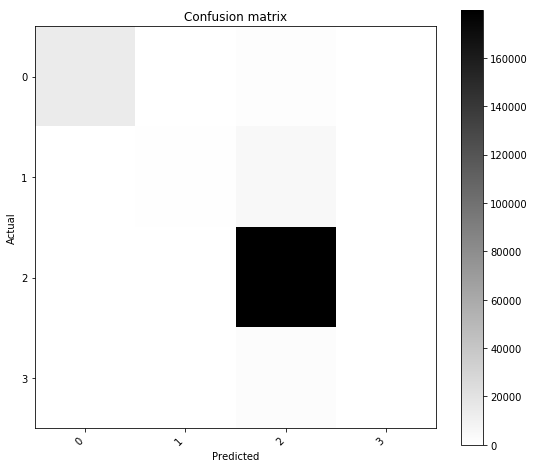

In [72]:
cm.plot()

In [75]:
model.save("model1.h5")

In [76]:
np.save('x_test_new',x_test)
np.save('y_test_new',y_test)